In [1]:
!pip install tslearn

     |████████████████████████████████| 798kB 9.6MB/s 


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
import math
%matplotlib inline
plt.style.use('seaborn')
import os

In [4]:
BASE_DIR = '/content/drive/My Drive/4th Year/CS 197 (Thesis)/FINAL - COVID Modeling/notebooks/data/'
file_path = os.path.join(BASE_DIR, 'combined_added_shifts.csv')
df = pd.read_csv(file_path, index_col=0)

In [5]:
df.head()

,Province/State,Country/Region,Lat,Long,populations,area,1/22/20_x,1/23/20_x,1/24/20_x,1/25/20_x,1/26/20_x,1/27/20_x,1/28/20_x,1/29/20_x,1/30/20_x,1/31/20_x,2/1/20_x,2/2/20_x,2/3/20_x,2/4/20_x,2/5/20_x,2/6/20_x,2/7/20_x,2/8/20_x,2/9/20_x,2/10/20_x,2/11/20_x,2/12/20_x,2/13/20_x,2/14/20_x,2/15/20_x,2/16/20_x,2/17/20_x,2/18/20_x,2/19/20_x,2/20/20_x,2/21/20_x,2/22/20_x,2/23/20_x,2/24/20_x,...,4/16/21_y,4/17/21_y,4/18/21_y,shifts,shift 1,shift 2,shift 3,shift 4,shift 5,shift 6,shift 7,shift 8,shift 9,shift 10,shift 11,shift 12,shift 13,shift 14,shift 15,shift 16,shift 17,shift 18,shift 19,shift 20,shift 21,shift 22,shift 23,shift 24,shift 25,shift 26,shift 27,shift 28,shift 29,shift 30,shift 31,shift 32,shift 33,shift 34,shift 35,shift 36
0,no province,Afghanistan,33.93911,67.709953,38928346,no province Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.781541e-10,...,0.003446,0.003578,0.003644,33,0,0,0,0,0,0,0,1,5,5,5,5,2,0,0,0,0,0,0,0,0,1,2,1,2,1,2,0,0,0,0,0,-1,-1,-1,-1
1,no province,Albania,41.15330,20.168300,2877797,no province Albania,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,...,0.108483,0.106209,0.104009,33,0,0,0,0,0,1,5,5,2,0,1,5,5,5,5,5,5,5,5,5,7,8,8,8,8,8,8,8,8,8,8,8,-1,-1,-1,-1
2,no province,Algeria,28.03390,1.659600,43851044,no province Algeria,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,...,0.002954,0.002961,0.002966,33,0,0,0,0,0,0,0,0,0,0,0,1,5,5,5,5,5,2,0,1,5,5,5,5,5,5,5,5,2,0,0,0,-1,-1,-1,-1
3,no province,Argentina,-38.41610,-63.616700,45195774,no province Argentina,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,...,0.113878,0.119493,0.126255,32,0,0,0,0,0,0,0,0,1,5,5,5,7,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,-1,-1,-1,-1,-1
4,no province,Armenia,40.06910,45.038200,2963243,no province Armenia,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,...,0.233164,0.237354,0.241448,34,0,0,0,0,1,5,5,5,7,8,8,8,8,8,8,4,5,7,8,8,8,8,8,8,8,8,8,4,5,7,8,8,8,-1,-1,-1


# K-Shape using tslearn

## Combined

In [6]:
MAX_SHIFTS = 36
data = df.iloc[:, -MAX_SHIFTS:]
data.head()

,shift 1,shift 2,shift 3,shift 4,shift 5,shift 6,shift 7,shift 8,shift 9,shift 10,shift 11,shift 12,shift 13,shift 14,shift 15,shift 16,shift 17,shift 18,shift 19,shift 20,shift 21,shift 22,shift 23,shift 24,shift 25,shift 26,shift 27,shift 28,shift 29,shift 30,shift 31,shift 32,shift 33,shift 34,shift 35,shift 36
0,0,0,0,0,0,0,0,1,5,5,5,5,2,0,0,0,0,0,0,0,0,1,2,1,2,1,2,0,0,0,0,0,-1,-1,-1,-1
1,0,0,0,0,0,1,5,5,2,0,1,5,5,5,5,5,5,5,5,5,7,8,8,8,8,8,8,8,8,8,8,8,-1,-1,-1,-1
2,0,0,0,0,0,0,0,0,0,0,0,1,5,5,5,5,5,2,0,1,5,5,5,5,5,5,5,5,2,0,0,0,-1,-1,-1,-1
3,0,0,0,0,0,0,0,0,1,5,5,5,7,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,-1,-1,-1,-1,-1
4,0,0,0,0,1,5,5,5,7,8,8,8,8,8,8,4,5,7,8,8,8,8,8,8,8,8,8,4,5,7,8,8,8,-1,-1,-1


In [12]:
from tslearn.clustering import KShape

class TimeSeriesModel:
  n_clusters = 0
  data = []
  model = None

  def __init__(self, n_clusters, data):
    self.n_clusters = n_clusters
    self.data = data
  
  def build_model(self, max_iter=100):
    model = KShape(n_clusters=self.n_clusters, max_iter=max_iter)
    model.fit(self.data)
    self.model = model

    return model

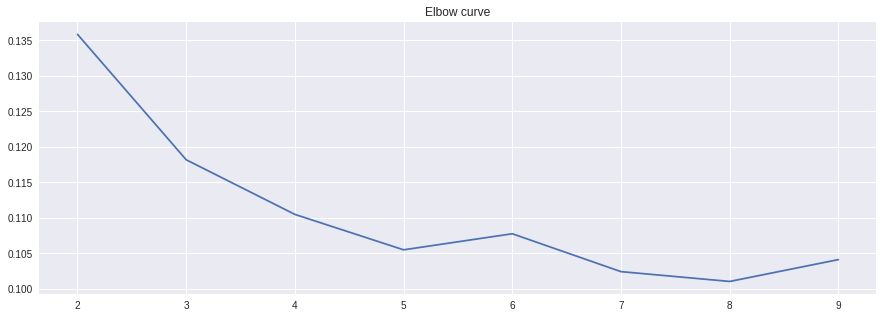

In [16]:
# is it normal that whenever you run this cell, the shape changes?
# Elbow method
def get_elbow(data):
  X = data
  distortions = []
  for k in range(2, 10):
    model_class = TimeSeriesModel(n_clusters=k, data=X)
    model = model_class.build_model()
    distortions.append(model.inertia_)

  fig = plt.figure(figsize=(15, 5))
  fig.add_axes()
  plt.plot(range(2, 10), distortions)
  plt.grid(True)
  plt.title('Elbow curve')

get_elbow(data)

In [17]:
# Number of clusters is based on the elbow method
NUM_CLUSTERS = 5

model_class = TimeSeriesModel(n_clusters=NUM_CLUSTERS, data=data)
model = model_class.build_model()

In [18]:
model.cluster_centers_[0]

array([[ 0.58586283],
       [ 0.84016959],
       [ 1.074914  ],
       [ 1.23863286],
       [ 1.33619192],
       [ 1.30857001],
       [ 1.36747608],
       [ 1.41865073],
       [ 1.39966158],
       [ 1.35045232],
       [ 1.36403465],
       [ 1.3504497 ],
       [ 1.34762294],
       [ 1.33484963],
       [-0.98278951],
       [-0.99476929],
       [-0.98789664],
       [-0.92771182],
       [-0.84394235],
       [-0.78081466],
       [-0.74014975],
       [-0.73691515],
       [-0.73940436],
       [-0.73940436],
       [-0.73940436],
       [-0.73940436],
       [-0.73940436],
       [-0.73616976],
       [-0.73616976],
       [-0.73616976],
       [-0.73616976],
       [-0.73616976],
       [-0.73616976],
       [-0.73616976],
       [-0.73616976],
       [-0.73616976]])

In [19]:
df['labels'] = model.labels_
df.head()

,Province/State,Country/Region,Lat,Long,populations,area,1/22/20_x,1/23/20_x,1/24/20_x,1/25/20_x,1/26/20_x,1/27/20_x,1/28/20_x,1/29/20_x,1/30/20_x,1/31/20_x,2/1/20_x,2/2/20_x,2/3/20_x,2/4/20_x,2/5/20_x,2/6/20_x,2/7/20_x,2/8/20_x,2/9/20_x,2/10/20_x,2/11/20_x,2/12/20_x,2/13/20_x,2/14/20_x,2/15/20_x,2/16/20_x,2/17/20_x,2/18/20_x,2/19/20_x,2/20/20_x,2/21/20_x,2/22/20_x,2/23/20_x,2/24/20_x,...,4/17/21_y,4/18/21_y,shifts,shift 1,shift 2,shift 3,shift 4,shift 5,shift 6,shift 7,shift 8,shift 9,shift 10,shift 11,shift 12,shift 13,shift 14,shift 15,shift 16,shift 17,shift 18,shift 19,shift 20,shift 21,shift 22,shift 23,shift 24,shift 25,shift 26,shift 27,shift 28,shift 29,shift 30,shift 31,shift 32,shift 33,shift 34,shift 35,shift 36,labels
0,no province,Afghanistan,33.93911,67.709953,38928346,no province Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.781541e-10,...,0.003578,0.003644,33,0,0,0,0,0,0,0,1,5,5,5,5,2,0,0,0,0,0,0,0,0,1,2,1,2,1,2,0,0,0,0,0,-1,-1,-1,-1,4
1,no province,Albania,41.15330,20.168300,2877797,no province Albania,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,...,0.106209,0.104009,33,0,0,0,0,0,1,5,5,2,0,1,5,5,5,5,5,5,5,5,5,7,8,8,8,8,8,8,8,8,8,8,8,-1,-1,-1,-1,0
2,no province,Algeria,28.03390,1.659600,43851044,no province Algeria,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,...,0.002961,0.002966,33,0,0,0,0,0,0,0,0,0,0,0,1,5,5,5,5,5,2,0,1,5,5,5,5,5,5,5,5,2,0,0,0,-1,-1,-1,-1,2
3,no province,Argentina,-38.41610,-63.616700,45195774,no province Argentina,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,...,0.119493,0.126255,32,0,0,0,0,0,0,0,0,1,5,5,5,7,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,-1,-1,-1,-1,-1,1
4,no province,Armenia,40.06910,45.038200,2963243,no province Armenia,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,...,0.237354,0.241448,34,0,0,0,0,1,5,5,5,7,8,8,8,8,8,8,4,5,7,8,8,8,8,8,8,8,8,8,4,5,7,8,8,8,-1,-1,-1,1


In [20]:
cluster1 = df[df['labels']==1]
countries = set(cluster1['Country/Region'])
ss = ','.join(countries)
ss

'Luxembourg,Panama,United Arab Emirates,Bosnia and Herzegovina,Bahrain,West Bank and Gaza,France,Argentina,Azerbaijan,Israel,Netherlands,Kazakhstan,Paraguay,Bangladesh,Chile,Costa Rica,Indonesia,Montenegro,US,Guatemala,Romania,United Kingdom,Libya,Philippines,Tunisia,Czechia,Moldova,Spain,Oman,Jamaica,Malta,Brazil,Colombia,Portugal,Venezuela,Lebanon,Armenia'

## Graphing the Clusters

In [21]:
# All countries
def get_graphs(df, cluster_num=0, last_columns=71):
  fig=plt.figure(figsize=(50,20))
  ax=fig.add_axes([0,0,1,1])
  ax.set_xlabel("Dates")
  ax.set_ylabel("Cases")

  df_cluster = df[df['labels'] == cluster_num]
  for idx, area in df_cluster.iterrows():
    x = area.index[6:-last_columns]
    y = [area[i] for i in x]
    
    ax.plot(x,y,label=area['Country/Region'])
    #comment out the line below to remove the labels of the area names.
    ax.legend()

In [ ]:
# for cols in df.columns[6::-37]:
#     df[cols][df[cols]<0]=0


In [22]:
for cols in df.columns[6:-MAX_SHIFTS-2]:
    if cols[-1]=='x':
        df=df.rename(columns={cols:cols[:-1]+'confirmed'})
    elif cols[-1]=='y':
        df=df.rename(columns={cols:cols[:-1]+'deaths'})
    # else:
    #     df=df.rename(columns={cols:cols+"_recovered"})
df.columns[6:-MAX_SHIFTS-2]

Index(['1/22/20_confirmed', '1/23/20_confirmed', '1/24/20_confirmed',
       '1/25/20_confirmed', '1/26/20_confirmed', '1/27/20_confirmed',
       '1/28/20_confirmed', '1/29/20_confirmed', '1/30/20_confirmed',
       '1/31/20_confirmed',
       ...
       '4/9/21_deaths', '4/10/21_deaths', '4/11/21_deaths', '4/12/21_deaths',
       '4/13/21_deaths', '4/14/21_deaths', '4/15/21_deaths', '4/16/21_deaths',
       '4/17/21_deaths', '4/18/21_deaths'],
      dtype='object', length=906)

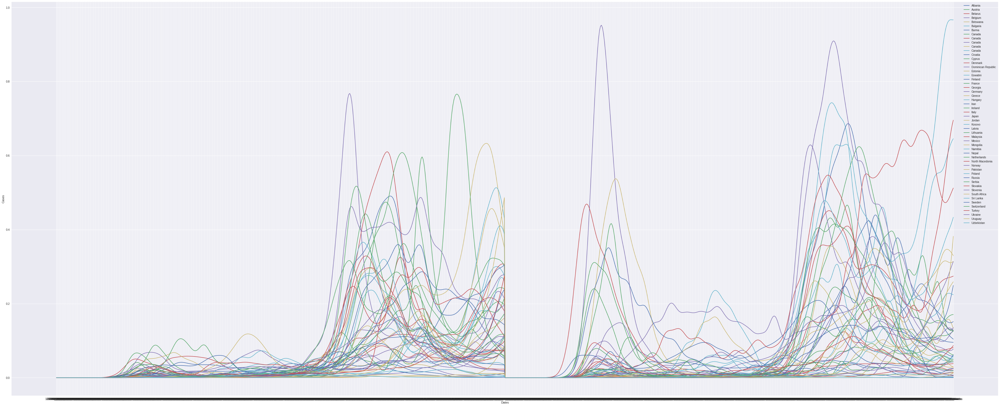

In [23]:
get_graphs(df, cluster_num=0, last_columns=38)

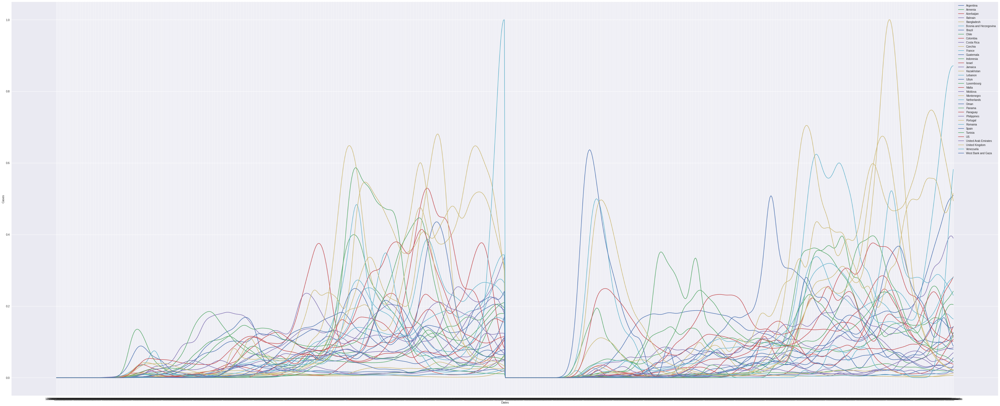

In [24]:
get_graphs(df, cluster_num=1, last_columns=38)

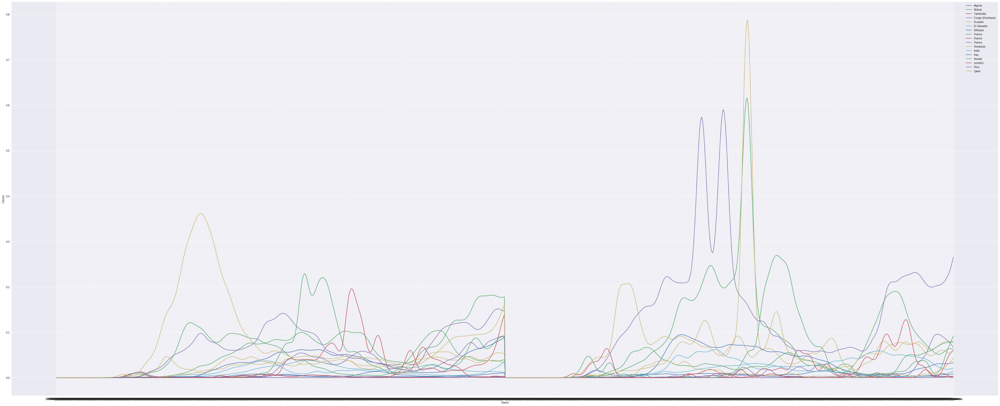

In [25]:
get_graphs(df, cluster_num=2, last_columns=38)

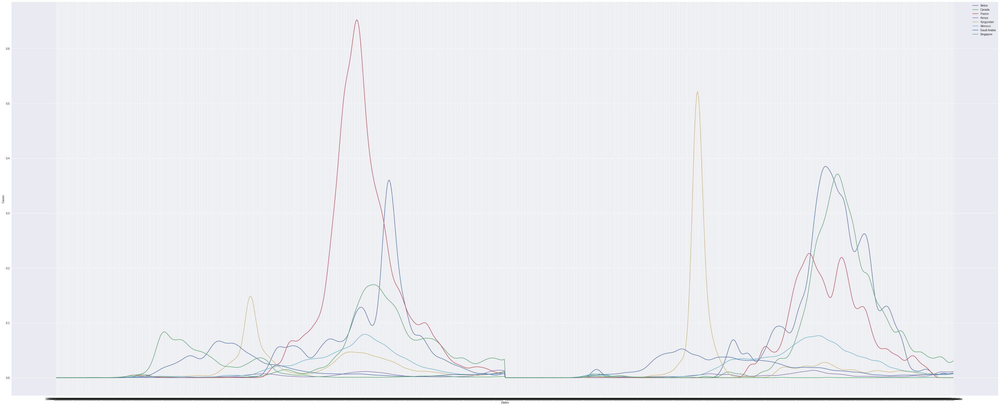

In [26]:
get_graphs(df, cluster_num=3, last_columns=38)

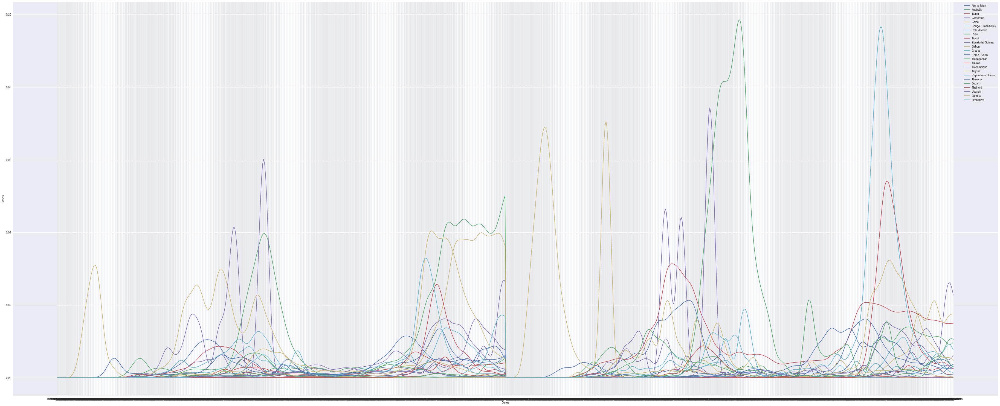

In [27]:
get_graphs(df, cluster_num=4, last_columns=38)

In [28]:
#get_graphs(df, cluster_num=5, last_columns=36)

In [29]:
df.shape

(140, 950)

In [ ]:
df.to_csv(os.path.join(BASE_DIR, 'new_clustered_countries_kshape.csv'))

## Deaths

In [ ]:
file_path = os.path.join(BASE_DIR, 'combined_added_shifts_deaths.csv')
df = pd.read_csv(file_path, index_col=0)

In [ ]:
df.head()

,Province/State,Country/Region,Lat,Long,populations,area,1/22/20_x,1/23/20_x,1/24/20_x,1/25/20_x,1/26/20_x,1/27/20_x,1/28/20_x,1/29/20_x,1/30/20_x,1/31/20_x,2/1/20_x,2/2/20_x,2/3/20_x,2/4/20_x,2/5/20_x,2/6/20_x,2/7/20_x,2/8/20_x,2/9/20_x,2/10/20_x,2/11/20_x,2/12/20_x,2/13/20_x,2/14/20_x,2/15/20_x,2/16/20_x,2/17/20_x,2/18/20_x,2/19/20_x,2/20/20_x,2/21/20_x,2/22/20_x,2/23/20_x,2/24/20_x,...,2/13/21,2/14/21,2/15/21,shifts,shift 1,shift 2,shift 3,shift 4,shift 5,shift 6,shift 7,shift 8,shift 9,shift 10,shift 11,shift 12,shift 13,shift 14,shift 15,shift 16,shift 17,shift 18,shift 19,shift 20,shift 21,shift 22,shift 23,shift 24,shift 25,shift 26,shift 27,shift 28,shift 29,shift 30,shift 31,shift 32,shift 33,shift 34,shift 35,shift 36
0,no province,Afghanistan,33.93911,67.709953,38928346,no province Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.320590e-10,...,0.001849,0.001674,0.001526,28,0,0,0,0,0,1,5,5,5,5,5,7,8,4,5,5,5,5,5,5,5,5,5,5,5,5,5,-1,-1,-1,-1,-1,-1,-1,-1,-1
1,no province,Albania,41.15330,20.168300,2877797,no province Albania,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,...,0.145479,0.147771,0.150433,28,0,0,0,0,1,5,5,5,2,1,5,5,7,8,8,8,8,8,8,8,8,8,8,8,8,8,8,-1,-1,-1,-1,-1,-1,-1,-1,-1
2,no province,Algeria,28.03390,1.659600,43851044,no province Algeria,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,...,0.003658,0.003646,0.003632,27,0,0,0,0,1,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
3,no province,Andorra,42.50630,1.521800,77265,no province Andorra,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,...,0.688341,0.685395,0.681212,36,0,0,0,0,1,7,8,8,8,8,4,2,1,7,4,2,0,0,1,7,4,2,0,0,1,7,8,8,8,4,7,8,8,8,8,-1
4,no province,Angola,-11.20270,17.873900,32866272,no province Angola,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,...,0.002486,0.002401,0.002315,28,0,0,0,0,0,0,0,0,0,0,0,1,2,1,5,5,5,5,5,5,5,5,5,5,5,5,5,-1,-1,-1,-1,-1,-1,-1,-1,-1


In [ ]:
MAX_SHIFTS = 36
data = df.iloc[:, -MAX_SHIFTS:]
data.head()

,shift 1,shift 2,shift 3,shift 4,shift 5,shift 6,shift 7,shift 8,shift 9,shift 10,shift 11,shift 12,shift 13,shift 14,shift 15,shift 16,shift 17,shift 18,shift 19,shift 20,shift 21,shift 22,shift 23,shift 24,shift 25,shift 26,shift 27,shift 28,shift 29,shift 30,shift 31,shift 32,shift 33,shift 34,shift 35,shift 36
0,0,0,0,0,0,1,5,5,5,5,5,7,8,4,5,5,5,5,5,5,5,5,5,5,5,5,5,-1,-1,-1,-1,-1,-1,-1,-1,-1
1,0,0,0,0,1,5,5,5,2,1,5,5,7,8,8,8,8,8,8,8,8,8,8,8,8,8,8,-1,-1,-1,-1,-1,-1,-1,-1,-1
2,0,0,0,0,1,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
3,0,0,0,0,1,7,8,8,8,8,4,2,1,7,4,2,0,0,1,7,4,2,0,0,1,7,8,8,8,4,7,8,8,8,8,-1
4,0,0,0,0,0,0,0,0,0,0,0,1,2,1,5,5,5,5,5,5,5,5,5,5,5,5,5,-1,-1,-1,-1,-1,-1,-1,-1,-1


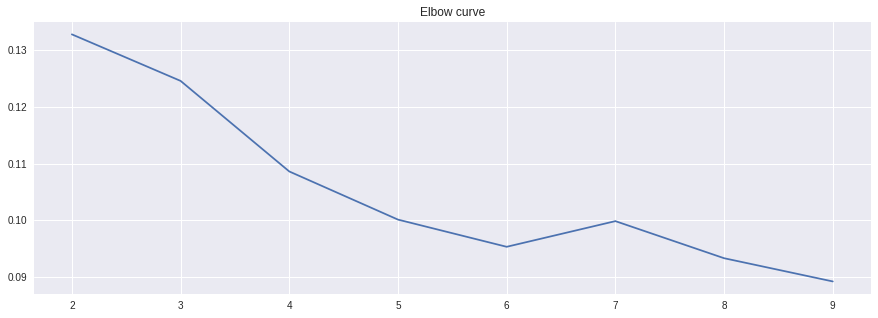

In [ ]:
get_elbow(data)

In [ ]:
# Number of clusters is based on the elbow method
NUM_CLUSTERS = 5

model_class = TimeSeriesModel(n_clusters=NUM_CLUSTERS, data=data)
model = model_class.build_model()

In [ ]:
model.cluster_centers_[0]

array([[ 0.13910891],
       [ 0.42178612],
       [ 0.52147219],
       [ 0.61983324],
       [ 0.83070686],
       [ 0.92979038],
       [ 0.95021129],
       [ 1.00593254],
       [ 0.96902051],
       [ 0.98964132],
       [ 0.98756802],
       [ 0.96144963],
       [ 0.9273681 ],
       [ 0.91184205],
       [ 0.8903358 ],
       [ 0.91011085],
       [ 0.89037584],
       [ 0.77629659],
       [ 0.90708306],
       [ 0.92542958],
       [ 0.97791688],
       [-1.27809051],
       [-1.28182725],
       [-1.28182725],
       [-1.27810346],
       [-1.27020942],
       [-1.27020942],
       [-1.25065296],
       [-1.23177143],
       [-1.20077173],
       [-1.11291221],
       [-0.99738083],
       [-0.99738083],
       [-0.99738083],
       [-0.99738083],
       [-0.99738083]])

In [ ]:
df['labels'] = model.labels_
df.head()

,Province/State,Country/Region,Lat,Long,populations,area,1/22/20_x,1/23/20_x,1/24/20_x,1/25/20_x,1/26/20_x,1/27/20_x,1/28/20_x,1/29/20_x,1/30/20_x,1/31/20_x,2/1/20_x,2/2/20_x,2/3/20_x,2/4/20_x,2/5/20_x,2/6/20_x,2/7/20_x,2/8/20_x,2/9/20_x,2/10/20_x,2/11/20_x,2/12/20_x,2/13/20_x,2/14/20_x,2/15/20_x,2/16/20_x,2/17/20_x,2/18/20_x,2/19/20_x,2/20/20_x,2/21/20_x,2/22/20_x,2/23/20_x,2/24/20_x,...,2/14/21,2/15/21,shifts,shift 1,shift 2,shift 3,shift 4,shift 5,shift 6,shift 7,shift 8,shift 9,shift 10,shift 11,shift 12,shift 13,shift 14,shift 15,shift 16,shift 17,shift 18,shift 19,shift 20,shift 21,shift 22,shift 23,shift 24,shift 25,shift 26,shift 27,shift 28,shift 29,shift 30,shift 31,shift 32,shift 33,shift 34,shift 35,shift 36,labels
0,no province,Afghanistan,33.93911,67.709953,38928346,no province Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.320590e-10,...,0.001674,0.001526,28,0,0,0,0,0,1,5,5,5,5,5,7,8,4,5,5,5,5,5,5,5,5,5,5,5,5,5,-1,-1,-1,-1,-1,-1,-1,-1,-1,0
1,no province,Albania,41.15330,20.168300,2877797,no province Albania,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,...,0.147771,0.150433,28,0,0,0,0,1,5,5,5,2,1,5,5,7,8,8,8,8,8,8,8,8,8,8,8,8,8,8,-1,-1,-1,-1,-1,-1,-1,-1,-1,0
2,no province,Algeria,28.03390,1.659600,43851044,no province Algeria,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,...,0.003646,0.003632,27,0,0,0,0,1,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0
3,no province,Andorra,42.50630,1.521800,77265,no province Andorra,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,...,0.685395,0.681212,36,0,0,0,0,1,7,8,8,8,8,4,2,1,7,4,2,0,0,1,7,4,2,0,0,1,7,8,8,8,4,7,8,8,8,8,-1,3
4,no province,Angola,-11.20270,17.873900,32866272,no province Angola,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,...,0.002401,0.002315,28,0,0,0,0,0,0,0,0,0,0,0,1,2,1,5,5,5,5,5,5,5,5,5,5,5,5,5,-1,-1,-1,-1,-1,-1,-1,-1,-1,3


In [ ]:
for cols in df.columns[6:-MAX_SHIFTS-2]:
    if cols[-1]=='x':
        df=df.rename(columns={cols:cols[:-1]+'confirmed'})
    elif cols[-1]=='y':
        df=df.rename(columns={cols:cols[:-1]+'deaths'})
    # else:
    #     df=df.rename(columns={cols:cols+"_recovered"})
df.columns[6:-MAX_SHIFTS-2]

Index(['1/22/20_confirmed', '1/23/20_confirmed', '1/24/20_confirmed',
       '1/25/20_confirmed', '1/26/20_confirmed', '1/27/20_confirmed',
       '1/28/20_confirmed', '1/29/20_confirmed', '1/30/20_confirmed',
       '1/31/20_confirmed',
       ...
       '2/6/21', '2/7/21', '2/8/21', '2/9/21', '2/10/21', '2/11/21', '2/12/21',
       '2/13/21', '2/14/21', '2/15/21'],
      dtype='object', length=1173)

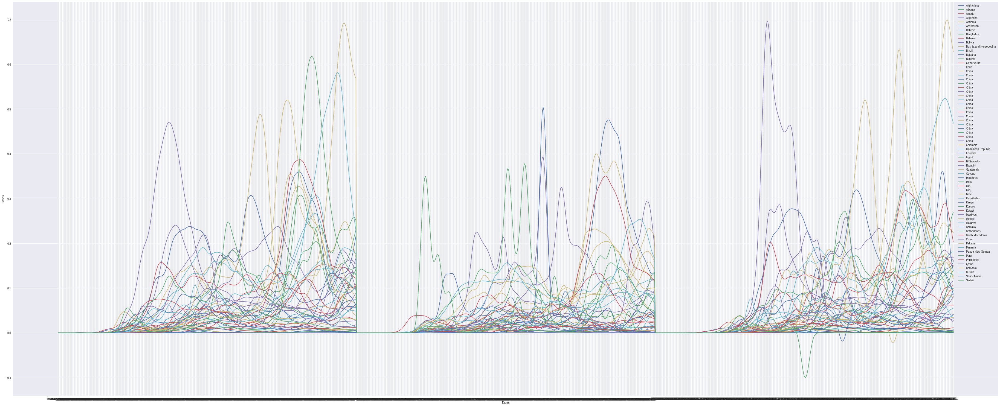

In [ ]:
get_graphs(df, cluster_num=0, last_columns=38)

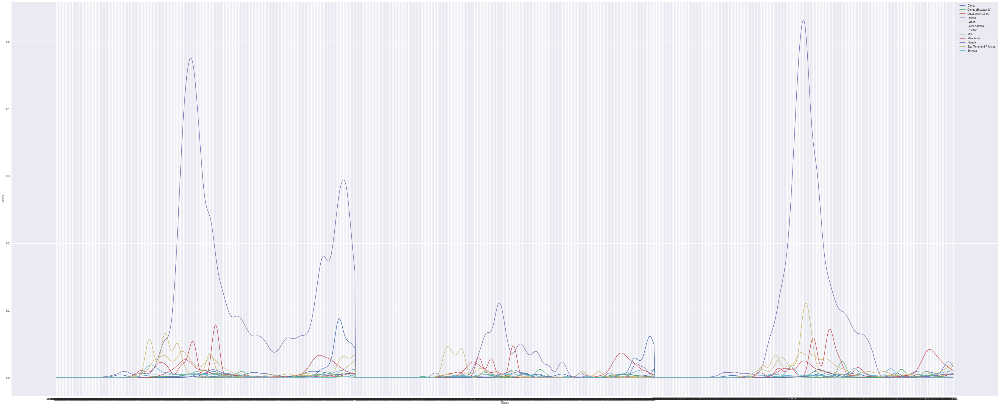

In [ ]:
get_graphs(df, cluster_num=1, last_columns=38)

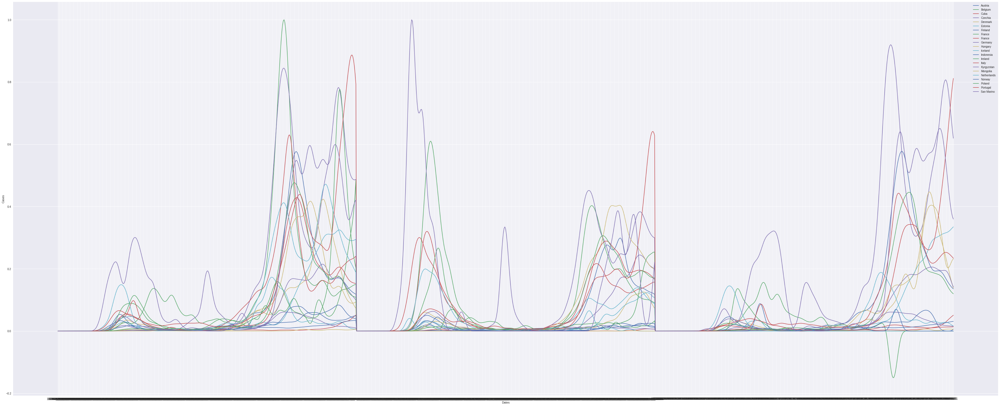

In [ ]:
get_graphs(df, cluster_num=2, last_columns=38)

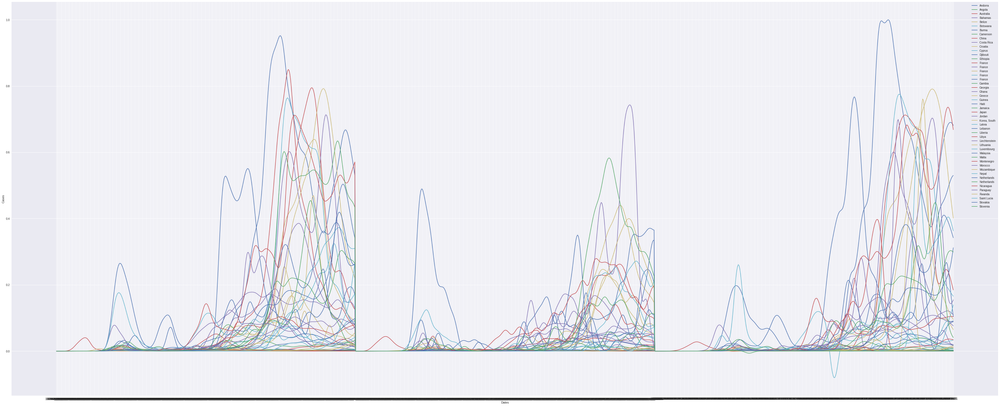

In [ ]:
get_graphs(df, cluster_num=3, last_columns=38)

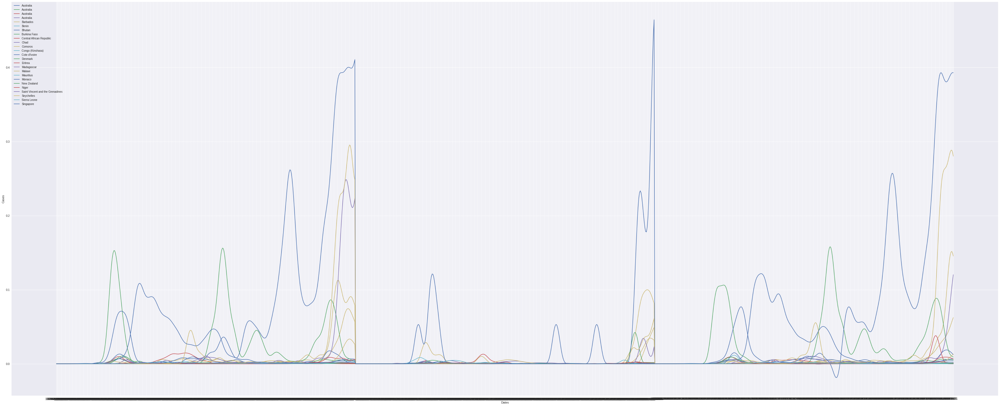

In [ ]:
get_graphs(df, cluster_num=4, last_columns=38)

## Recoveries

In [ ]:
file_path = os.path.join(BASE_DIR, 'combined_added_shifts_recoveries.csv')
df = pd.read_csv(file_path, index_col=0)

In [ ]:
df.head()

,Province/State,Country/Region,Lat,Long,populations,area,1/22/20_x,1/23/20_x,1/24/20_x,1/25/20_x,1/26/20_x,1/27/20_x,1/28/20_x,1/29/20_x,1/30/20_x,1/31/20_x,2/1/20_x,2/2/20_x,2/3/20_x,2/4/20_x,2/5/20_x,2/6/20_x,2/7/20_x,2/8/20_x,2/9/20_x,2/10/20_x,2/11/20_x,2/12/20_x,2/13/20_x,2/14/20_x,2/15/20_x,2/16/20_x,2/17/20_x,2/18/20_x,2/19/20_x,2/20/20_x,2/21/20_x,2/22/20_x,2/23/20_x,2/24/20_x,...,2/10/21,2/11/21,2/12/21,2/13/21,2/14/21,2/15/21,shifts,shift 1,shift 2,shift 3,shift 4,shift 5,shift 6,shift 7,shift 8,shift 9,shift 10,shift 11,shift 12,shift 13,shift 14,shift 15,shift 16,shift 17,shift 18,shift 19,shift 20,shift 21,shift 22,shift 23,shift 24,shift 25,shift 26,shift 27,shift 28,shift 29,shift 30,shift 31,shift 32,shift 33
0,no province,Afghanistan,33.93911,67.709953,38928346,no province Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.320590e-10,...,0.002543,0.002285,0.002053,0.001849,0.001674,0.001526,28,0,0,0,0,0,0,0,1,5,5,5,7,8,4,5,5,5,5,5,5,5,5,5,5,5,5,5,-1,-1,-1,-1,-1,-1
1,no province,Albania,41.15330,20.168300,2877797,no province Albania,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,...,0.139990,0.141675,0.143476,0.145479,0.147771,0.150433,27,0,0,0,0,1,5,5,5,5,5,5,7,8,8,8,8,8,8,8,8,8,8,8,8,8,8,-1,-1,-1,-1,-1,-1,-1
2,no province,Algeria,28.03390,1.659600,43851044,no province Algeria,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,...,0.003674,0.003672,0.003667,0.003658,0.003646,0.003632,27,0,0,0,0,0,1,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,7,4,5,5,5,-1,-1,-1,-1,-1,-1,-1
3,no province,Andorra,42.50630,1.521800,77265,no province Andorra,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,...,0.689300,0.690354,0.690013,0.688341,0.685395,0.681212,29,0,0,0,0,1,5,7,8,8,8,8,8,4,5,5,7,8,8,8,8,8,8,8,8,8,8,8,8,-1,-1,-1,-1,-1
4,no province,Angola,-11.20270,17.873900,32866272,no province Angola,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,...,0.002819,0.002684,0.002577,0.002486,0.002401,0.002315,29,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,1,5,2,1,5,5,5,5,5,5,5,5,5,-1,-1,-1,-1,-1


In [ ]:
MAX_SHIFTS = 33
data = df.iloc[:, -MAX_SHIFTS:]
data.head()

,shift 1,shift 2,shift 3,shift 4,shift 5,shift 6,shift 7,shift 8,shift 9,shift 10,shift 11,shift 12,shift 13,shift 14,shift 15,shift 16,shift 17,shift 18,shift 19,shift 20,shift 21,shift 22,shift 23,shift 24,shift 25,shift 26,shift 27,shift 28,shift 29,shift 30,shift 31,shift 32,shift 33
0,0,0,0,0,0,0,0,1,5,5,5,7,8,4,5,5,5,5,5,5,5,5,5,5,5,5,5,-1,-1,-1,-1,-1,-1
1,0,0,0,0,1,5,5,5,5,5,5,7,8,8,8,8,8,8,8,8,8,8,8,8,8,8,-1,-1,-1,-1,-1,-1,-1
2,0,0,0,0,0,1,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,7,4,5,5,5,-1,-1,-1,-1,-1,-1,-1
3,0,0,0,0,1,5,7,8,8,8,8,8,4,5,5,7,8,8,8,8,8,8,8,8,8,8,8,8,-1,-1,-1,-1,-1
4,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,1,5,2,1,5,5,5,5,5,5,5,5,5,-1,-1,-1,-1,-1


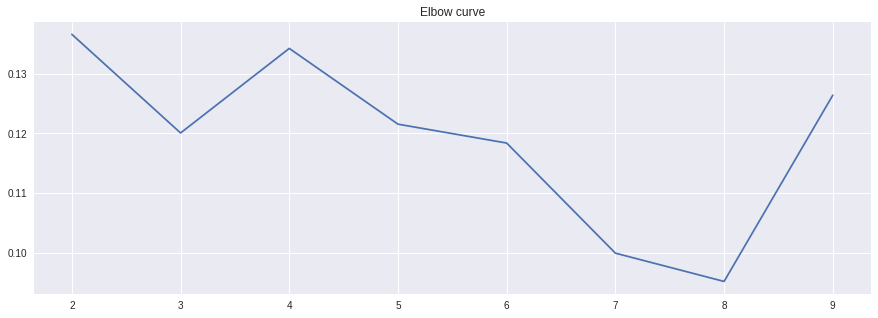

In [ ]:
get_elbow(data)

In [ ]:
# Number of clusters is based on the elbow method
NUM_CLUSTERS = 4

model_class = TimeSeriesModel(n_clusters=NUM_CLUSTERS, data=data)
model = model_class.build_model()

In [ ]:
model.cluster_centers_[0]

array([[-0.67160598],
       [-0.56751201],
       [-0.56751201],
       [-0.64558249],
       [-0.59784294],
       [-0.36001808],
       [-0.46088183],
       [-0.16981332],
       [-0.11048141],
       [ 0.30248051],
       [ 0.73216456],
       [ 1.32720252],
       [ 1.84778353],
       [ 1.95300361],
       [ 1.99442984],
       [ 1.88599522],
       [ 1.71261897],
       [ 1.54554399],
       [ 0.92662108],
       [-0.76596423],
       [-0.86883124],
       [-0.86883124],
       [-0.81367877],
       [-0.61930895],
       [-0.65336922],
       [-0.68570803],
       [-0.58565308],
       [-0.52174641],
       [-0.62641906],
       [-0.66036727],
       [-0.78095594],
       [-0.79568067],
       [-0.83007966]])

In [ ]:
df['labels'] = model.labels_
df.head()

,Province/State,Country/Region,Lat,Long,populations,area,1/22/20_x,1/23/20_x,1/24/20_x,1/25/20_x,1/26/20_x,1/27/20_x,1/28/20_x,1/29/20_x,1/30/20_x,1/31/20_x,2/1/20_x,2/2/20_x,2/3/20_x,2/4/20_x,2/5/20_x,2/6/20_x,2/7/20_x,2/8/20_x,2/9/20_x,2/10/20_x,2/11/20_x,2/12/20_x,2/13/20_x,2/14/20_x,2/15/20_x,2/16/20_x,2/17/20_x,2/18/20_x,2/19/20_x,2/20/20_x,2/21/20_x,2/22/20_x,2/23/20_x,2/24/20_x,...,2/11/21,2/12/21,2/13/21,2/14/21,2/15/21,shifts,shift 1,shift 2,shift 3,shift 4,shift 5,shift 6,shift 7,shift 8,shift 9,shift 10,shift 11,shift 12,shift 13,shift 14,shift 15,shift 16,shift 17,shift 18,shift 19,shift 20,shift 21,shift 22,shift 23,shift 24,shift 25,shift 26,shift 27,shift 28,shift 29,shift 30,shift 31,shift 32,shift 33,labels
0,no province,Afghanistan,33.93911,67.709953,38928346,no province Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.320590e-10,...,0.002285,0.002053,0.001849,0.001674,0.001526,28,0,0,0,0,0,0,0,1,5,5,5,7,8,4,5,5,5,5,5,5,5,5,5,5,5,5,5,-1,-1,-1,-1,-1,-1,2
1,no province,Albania,41.15330,20.168300,2877797,no province Albania,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,...,0.141675,0.143476,0.145479,0.147771,0.150433,27,0,0,0,0,1,5,5,5,5,5,5,7,8,8,8,8,8,8,8,8,8,8,8,8,8,8,-1,-1,-1,-1,-1,-1,-1,2
2,no province,Algeria,28.03390,1.659600,43851044,no province Algeria,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,...,0.003672,0.003667,0.003658,0.003646,0.003632,27,0,0,0,0,0,1,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,7,4,5,5,5,-1,-1,-1,-1,-1,-1,-1,2
3,no province,Andorra,42.50630,1.521800,77265,no province Andorra,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,...,0.690354,0.690013,0.688341,0.685395,0.681212,29,0,0,0,0,1,5,7,8,8,8,8,8,4,5,5,7,8,8,8,8,8,8,8,8,8,8,8,8,-1,-1,-1,-1,-1,2
4,no province,Angola,-11.20270,17.873900,32866272,no province Angola,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,...,0.002684,0.002577,0.002486,0.002401,0.002315,29,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,1,5,2,1,5,5,5,5,5,5,5,5,5,-1,-1,-1,-1,-1,3


In [ ]:
for cols in df.columns[6:-MAX_SHIFTS-2]:
    if cols[-1]=='x':
        df=df.rename(columns={cols:cols[:-1]+'confirmed'})
    elif cols[-1]=='y':
        df=df.rename(columns={cols:cols[:-1]+'deaths'})
    # else:
    #     df=df.rename(columns={cols:cols+"_recovered"})
df.columns[6:-MAX_SHIFTS-2]

Index(['1/22/20_confirmed', '1/23/20_confirmed', '1/24/20_confirmed',
       '1/25/20_confirmed', '1/26/20_confirmed', '1/27/20_confirmed',
       '1/28/20_confirmed', '1/29/20_confirmed', '1/30/20_confirmed',
       '1/31/20_confirmed',
       ...
       '2/6/21', '2/7/21', '2/8/21', '2/9/21', '2/10/21', '2/11/21', '2/12/21',
       '2/13/21', '2/14/21', '2/15/21'],
      dtype='object', length=1173)

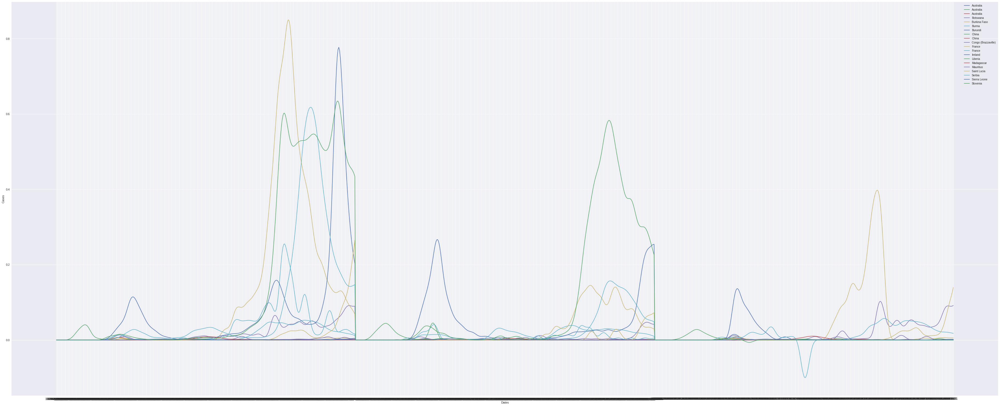

In [ ]:
get_graphs(df, cluster_num=0, last_columns=35)

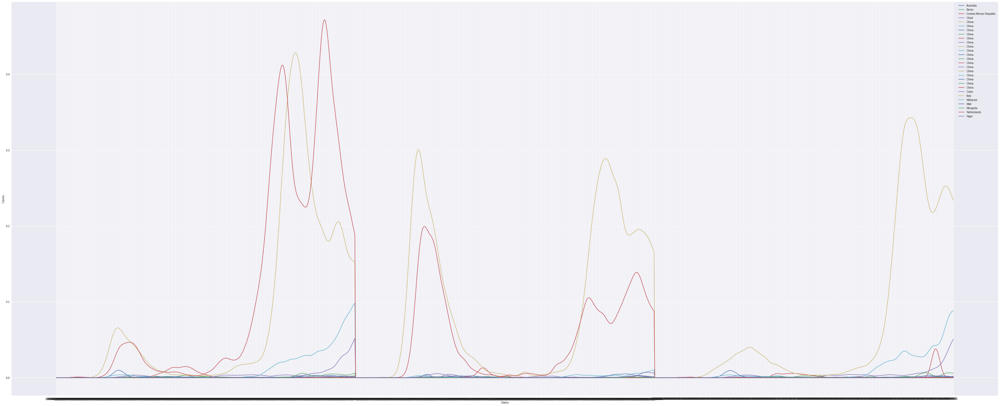

In [ ]:
get_graphs(df, cluster_num=1, last_columns=35)

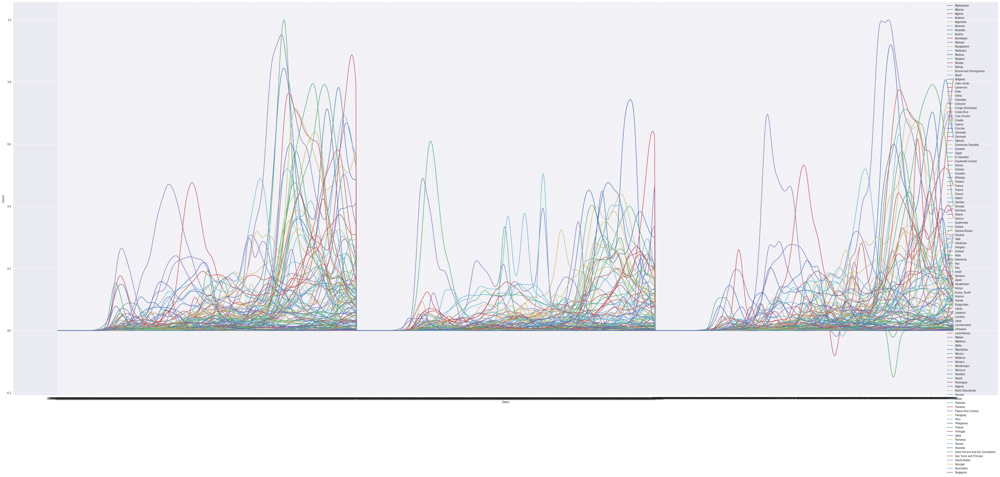

In [ ]:
get_graphs(df, cluster_num=2, last_columns=35)

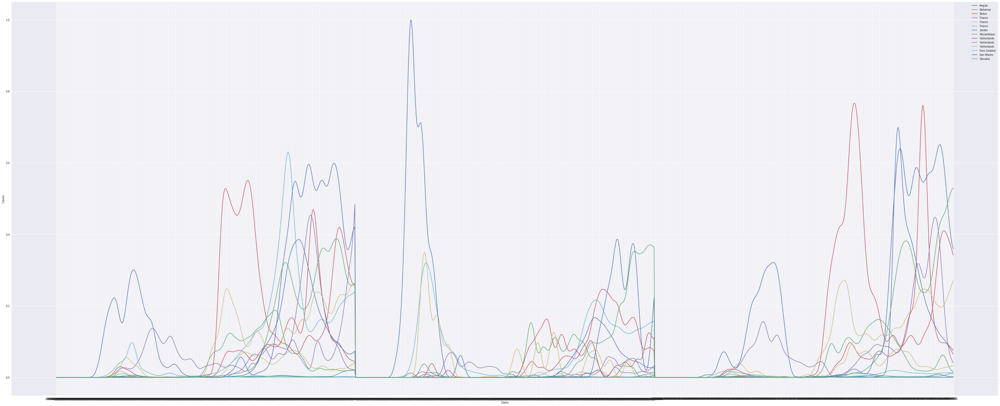

In [ ]:
get_graphs(df, cluster_num=3, last_columns=35)